## Conditional Spectrum (CS) Based Record Selection for Multiple-Stripe Analysis (MSA) Upon Carrying out Probabilistic Seismic Hazard Analysis (PSHA) via OpenQuake

### 1) Perform PSHA via OpenQuake

In [ ]:
# Hazard Analysis via OpenQuake
# Set path to OpenQuake model .ini file path
from time import time
import os
import numpy as np
parent_path = os.path.dirname(os.path.realpath(""))
oq_model = os.path.join(parent_path,'input files','OQ_Model') # this is the folder where oq model is located
oq_ini = 'job.ini' # this is .ini file used to run hazard model via openquake

# Set command to call OpenQuake
oq = 'oq'

# Directory to place post-processing results
post_dir = 'OQproc_Outputs'

# Read .ini file for post-processing purposes
with open(os.path.join(oq_model,oq_ini)) as f:
    info = f.readlines()
    for line in info:
        if line.startswith('poes'):
            poes = [float(poe) for poe in
                    line.split('\n')[0].split('=')[1].split(',')]
        if line.startswith('export_dir'):
            results_dir = os.path.join(oq_model, line.split('\n')[0].split('=')[1].strip())
        if line.startswith('mag_bin_width'):
            exec(line.strip())
        if line.startswith('distance_bin_width'):
            exec(line.strip())
        if line.startswith('reference_vs30_value'):
            exec(line.strip())

# Create the export directory for analysis results
make_dir(results_dir)

# Create the directory for processed results
make_dir(post_dir)

# Run the analysis via system command
cwd = os.getcwd() # Current working directory
os.chdir(oq_model) # Change directory, head to OQ_model folder
os.system(oq + ' engine --run ' + oq_ini + ' --exports csv')
os.chdir(cwd) # go back to the previous working directory

### 2) Post-process PSHA results

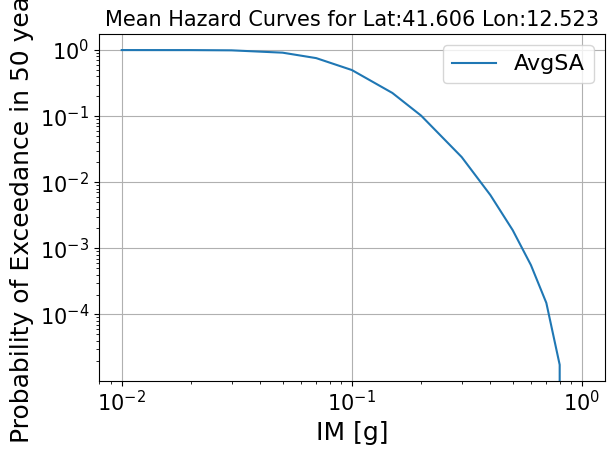

C:\Users\osama\AppData\Local\Temp\ipykernel_15064\4124522720.py:194: MatplotlibDeprecationWarning: The get_cmap function was deprecated in Matplotlib 3.7 and will be removed two minor releases later. Use ``matplotlib.colormaps[name]`` or ``matplotlib.colormaps.get_cmap(obj)`` instead.
  cmap = cm.get_cmap('jet')  # Get desired colormap


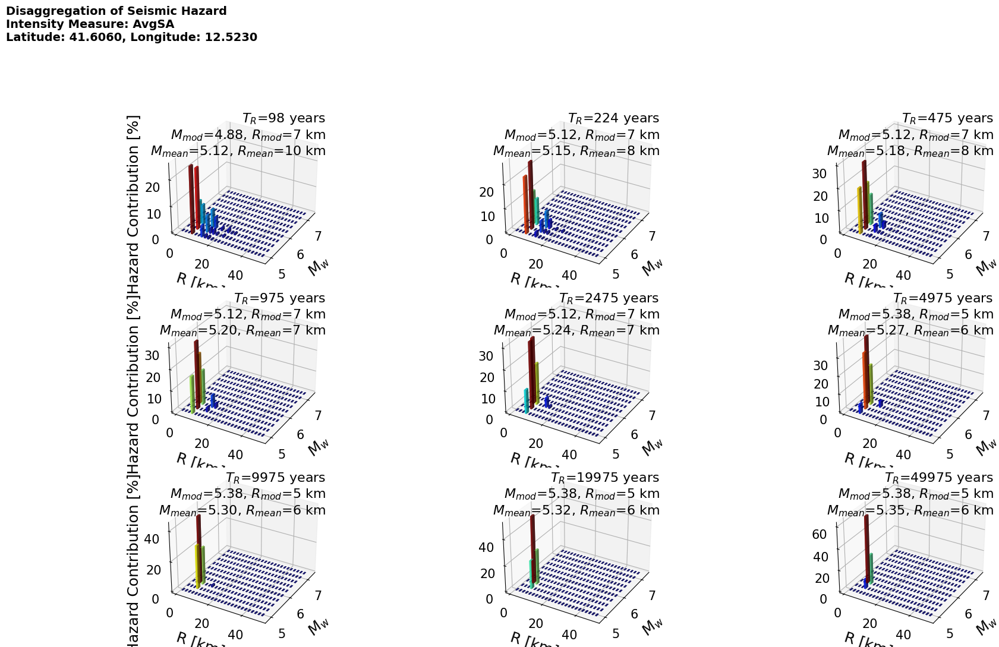

C:\Users\osama\AppData\Local\Temp\ipykernel_15064\4124522720.py:339: MatplotlibDeprecationWarning: The get_cmap function was deprecated in Matplotlib 3.7 and will be removed two minor releases later. Use ``matplotlib.colormaps[name]`` or ``matplotlib.colormaps.get_cmap(obj)`` instead.
  cmap = cm.get_cmap('jet')  # Get desired colormap


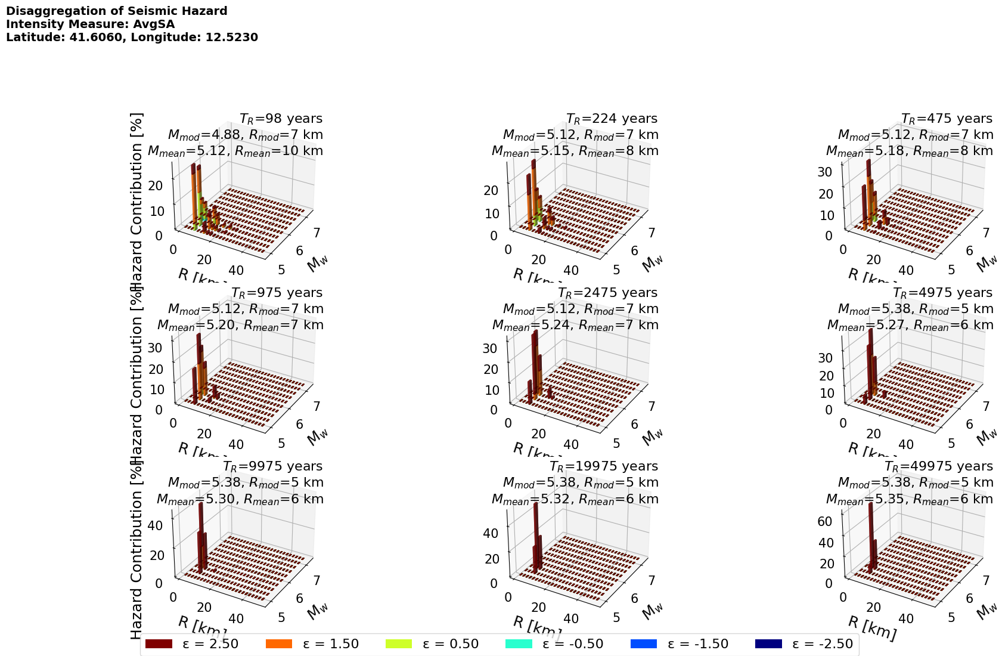

In [7]:
# Extract and plot hazard curves in a reasonable format
hazard_curve(poes, results_dir, post_dir, show=1)

# Extract and plot disaggregation results by M and R
disaggregation_mag_dist(mag_bin_width, distance_bin_width, results_dir, post_dir, num_rows=3, show=1)

# Extract and plot disaggregation results by M, R and epsilon
disaggregation_mag_dist_eps(mag_bin_width, distance_bin_width, results_dir, post_dir, num_rows=3, show=1)

### 3) Select the ground motions for different return periods, IM=AvgSA(T*)

GMPE name: BooreEtAl2014
Supported tectonic region: ACTIVE_SHALLOW_CRUST
Supported standard deviation: Total, Intra event, Inter event
Supported intensity measure: SA, PGA, PGV
Supported intensity measure component: RotD50
Supported SA period range: 0.01 - 0.7000000000000001
Required distance parameters: rjb
Required rupture parameters: mag, rake
Required site parameters: vs30
Changing number of components to 2 for this horizontal spectra component definition: RotD50...


C:\Users\osama\AppData\Local\Temp\ipykernel_15064\1688969730.py:2096: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  mu_lnSaT[i] = params[0]
C:\Users\osama\AppData\Local\Temp\ipykernel_15064\1688969730.py:2097: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  sigma_lnSaT[i] = params[1][0]
C:\Users\osama\AppData\Local\Temp\ipykernel_15064\1688969730.py:2096: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  mu_lnSaT[i] = params[0]
C:\Users\osama\AppData\Local\Temp\ipykernel

Target spectrum is created.
Ground motion selection is finished.
For T ∈ [0.05 - 2.50]
Max error in median = 5.03 %
Max error in standard deviation = 8.97 %
The errors are within the target 10 percent %


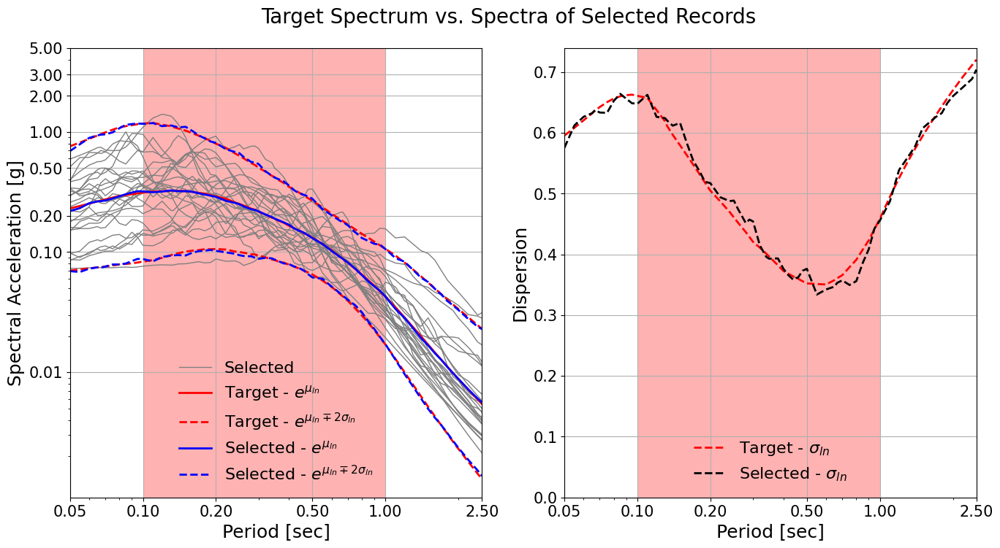

Finished writing process, the files are located in
c:\Users\osama\OneDrive\Desktop\EzGM-master 2\EzGM-master\Examples\binder\EzGM_Outputs_AvgSA\POE-0.4-in-50-years
Changing number of components to 2 for this horizontal spectra component definition: RotD50...


C:\Users\osama\AppData\Local\Temp\ipykernel_15064\1688969730.py:2096: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  mu_lnSaT[i] = params[0]
C:\Users\osama\AppData\Local\Temp\ipykernel_15064\1688969730.py:2097: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  sigma_lnSaT[i] = params[1][0]
C:\Users\osama\AppData\Local\Temp\ipykernel_15064\1688969730.py:2096: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  mu_lnSaT[i] = params[0]
C:\Users\osama\AppData\Local\Temp\ipykernel

Target spectrum is created.
Ground motion selection is finished.
For T ∈ [0.05 - 2.50]
Max error in median = 8.36 %
Max error in standard deviation = 9.76 %
The errors are within the target 10 percent %


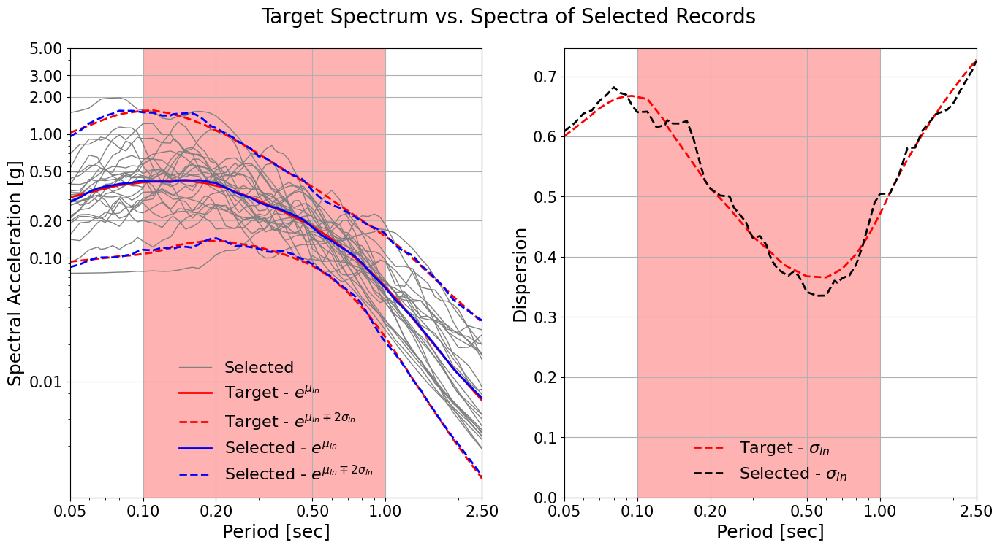

Finished writing process, the files are located in
c:\Users\osama\OneDrive\Desktop\EzGM-master 2\EzGM-master\Examples\binder\EzGM_Outputs_AvgSA\POE-0.2-in-50-years
Changing number of components to 2 for this horizontal spectra component definition: RotD50...


C:\Users\osama\AppData\Local\Temp\ipykernel_15064\1688969730.py:2096: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  mu_lnSaT[i] = params[0]
C:\Users\osama\AppData\Local\Temp\ipykernel_15064\1688969730.py:2097: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  sigma_lnSaT[i] = params[1][0]
C:\Users\osama\AppData\Local\Temp\ipykernel_15064\1688969730.py:2096: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  mu_lnSaT[i] = params[0]
C:\Users\osama\AppData\Local\Temp\ipykernel

Target spectrum is created.
Ground motion selection is finished.
For T ∈ [0.05 - 2.50]
Max error in median = 5.94 %
Max error in standard deviation = 11.75 %


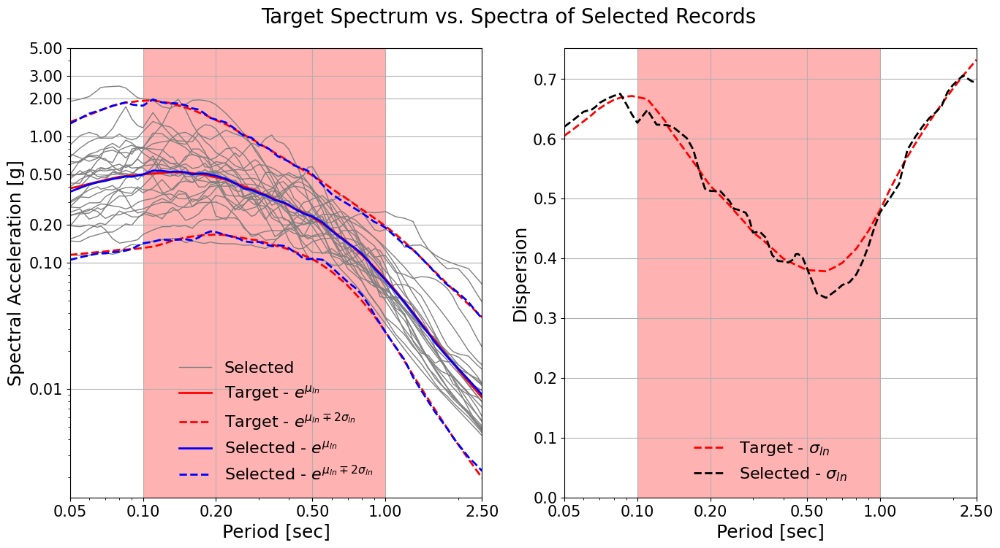

Finished writing process, the files are located in
c:\Users\osama\OneDrive\Desktop\EzGM-master 2\EzGM-master\Examples\binder\EzGM_Outputs_AvgSA\POE-0.1-in-50-years
Changing number of components to 2 for this horizontal spectra component definition: RotD50...


C:\Users\osama\AppData\Local\Temp\ipykernel_15064\1688969730.py:2096: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  mu_lnSaT[i] = params[0]
C:\Users\osama\AppData\Local\Temp\ipykernel_15064\1688969730.py:2097: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  sigma_lnSaT[i] = params[1][0]
C:\Users\osama\AppData\Local\Temp\ipykernel_15064\1688969730.py:2096: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  mu_lnSaT[i] = params[0]
C:\Users\osama\AppData\Local\Temp\ipykernel

Target spectrum is created.
Ground motion selection is finished.
For T ∈ [0.05 - 2.50]
Max error in median = 12.04 %
Max error in standard deviation = 14.14 %


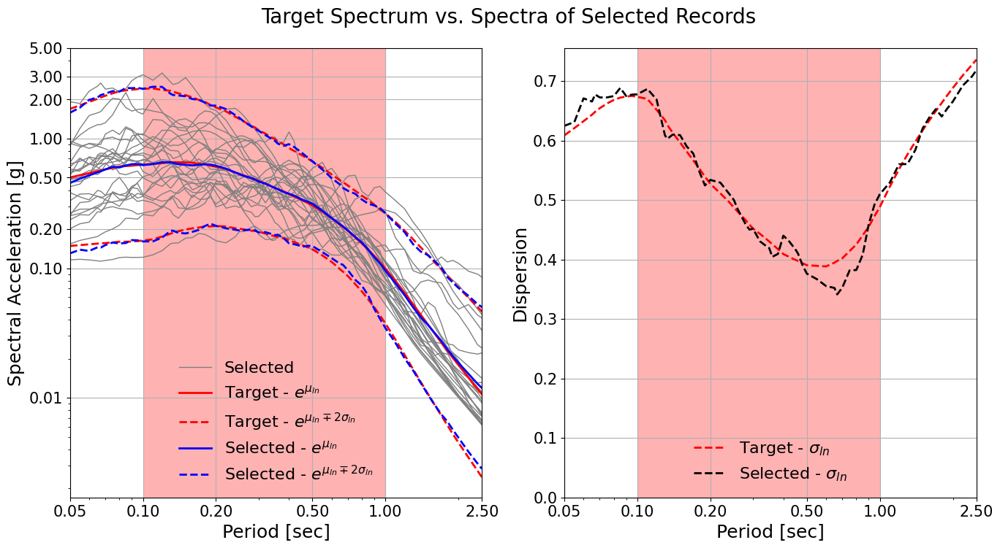

Finished writing process, the files are located in
c:\Users\osama\OneDrive\Desktop\EzGM-master 2\EzGM-master\Examples\binder\EzGM_Outputs_AvgSA\POE-0.05-in-50-years
Changing number of components to 2 for this horizontal spectra component definition: RotD50...


C:\Users\osama\AppData\Local\Temp\ipykernel_15064\1688969730.py:2096: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  mu_lnSaT[i] = params[0]
C:\Users\osama\AppData\Local\Temp\ipykernel_15064\1688969730.py:2097: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  sigma_lnSaT[i] = params[1][0]
C:\Users\osama\AppData\Local\Temp\ipykernel_15064\1688969730.py:2096: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  mu_lnSaT[i] = params[0]
C:\Users\osama\AppData\Local\Temp\ipykernel

Target spectrum is created.
Ground motion selection is finished.
For T ∈ [0.05 - 2.50]
Max error in median = 14.16 %
Max error in standard deviation = 21.17 %


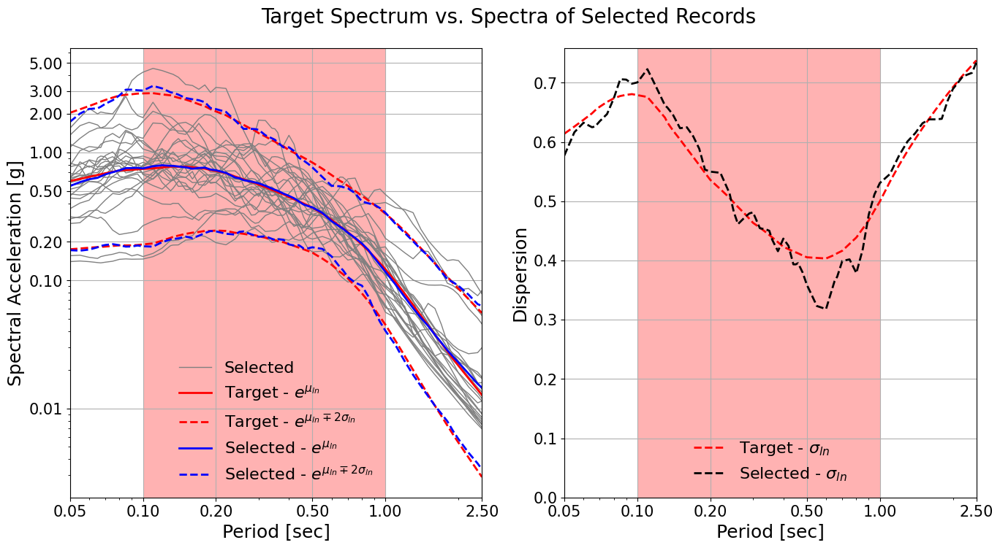

Finished writing process, the files are located in
c:\Users\osama\OneDrive\Desktop\EzGM-master 2\EzGM-master\Examples\binder\EzGM_Outputs_AvgSA\POE-0.02-in-50-years
Changing number of components to 2 for this horizontal spectra component definition: RotD50...


C:\Users\osama\AppData\Local\Temp\ipykernel_15064\1688969730.py:2096: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  mu_lnSaT[i] = params[0]
C:\Users\osama\AppData\Local\Temp\ipykernel_15064\1688969730.py:2097: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  sigma_lnSaT[i] = params[1][0]
C:\Users\osama\AppData\Local\Temp\ipykernel_15064\1688969730.py:2096: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  mu_lnSaT[i] = params[0]
C:\Users\osama\AppData\Local\Temp\ipykernel

Target spectrum is created.
Ground motion selection is finished.
For T ∈ [0.05 - 2.50]
Max error in median = 13.92 %
Max error in standard deviation = 29.23 %


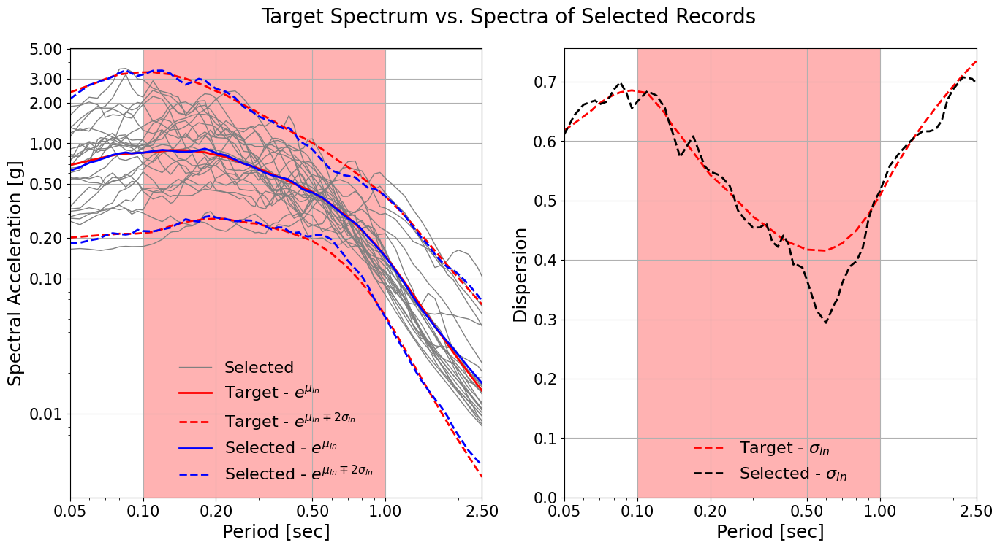

Finished writing process, the files are located in
c:\Users\osama\OneDrive\Desktop\EzGM-master 2\EzGM-master\Examples\binder\EzGM_Outputs_AvgSA\POE-0.01-in-50-years
Changing number of components to 2 for this horizontal spectra component definition: RotD50...


C:\Users\osama\AppData\Local\Temp\ipykernel_15064\1688969730.py:2096: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  mu_lnSaT[i] = params[0]
C:\Users\osama\AppData\Local\Temp\ipykernel_15064\1688969730.py:2097: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  sigma_lnSaT[i] = params[1][0]
C:\Users\osama\AppData\Local\Temp\ipykernel_15064\1688969730.py:2096: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  mu_lnSaT[i] = params[0]
C:\Users\osama\AppData\Local\Temp\ipykernel

Target spectrum is created.
Ground motion selection is finished.
For T ∈ [0.05 - 2.50]
Max error in median = 12.83 %
Max error in standard deviation = 17.22 %


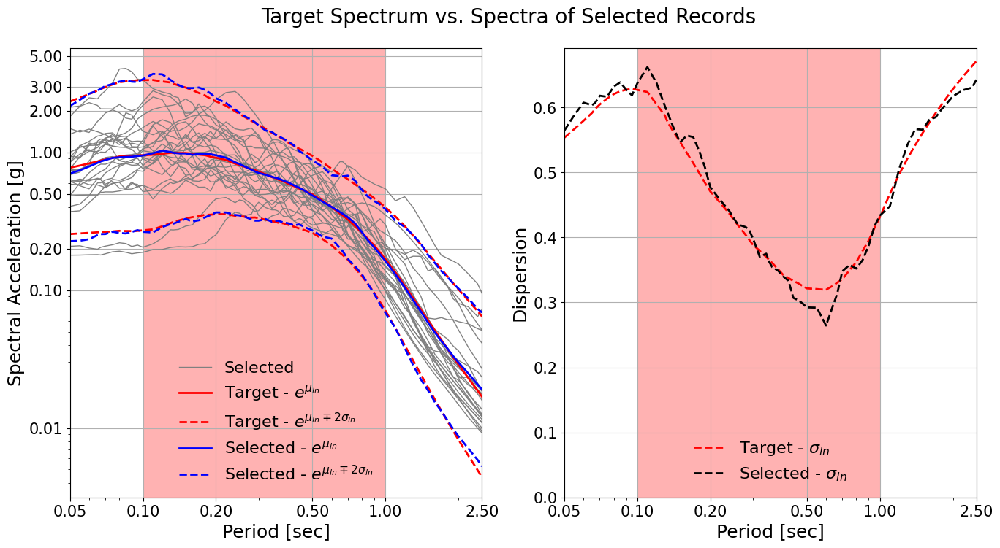

Finished writing process, the files are located in
c:\Users\osama\OneDrive\Desktop\EzGM-master 2\EzGM-master\Examples\binder\EzGM_Outputs_AvgSA\POE-0.005-in-50-years
Changing number of components to 2 for this horizontal spectra component definition: RotD50...


C:\Users\osama\AppData\Local\Temp\ipykernel_15064\1688969730.py:2096: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  mu_lnSaT[i] = params[0]
C:\Users\osama\AppData\Local\Temp\ipykernel_15064\1688969730.py:2097: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  sigma_lnSaT[i] = params[1][0]
C:\Users\osama\AppData\Local\Temp\ipykernel_15064\1688969730.py:2096: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  mu_lnSaT[i] = params[0]
C:\Users\osama\AppData\Local\Temp\ipykernel

Target spectrum is created.
Ground motion selection is finished.
For T ∈ [0.05 - 2.50]
Max error in median = 21.74 %
Max error in standard deviation = 27.07 %


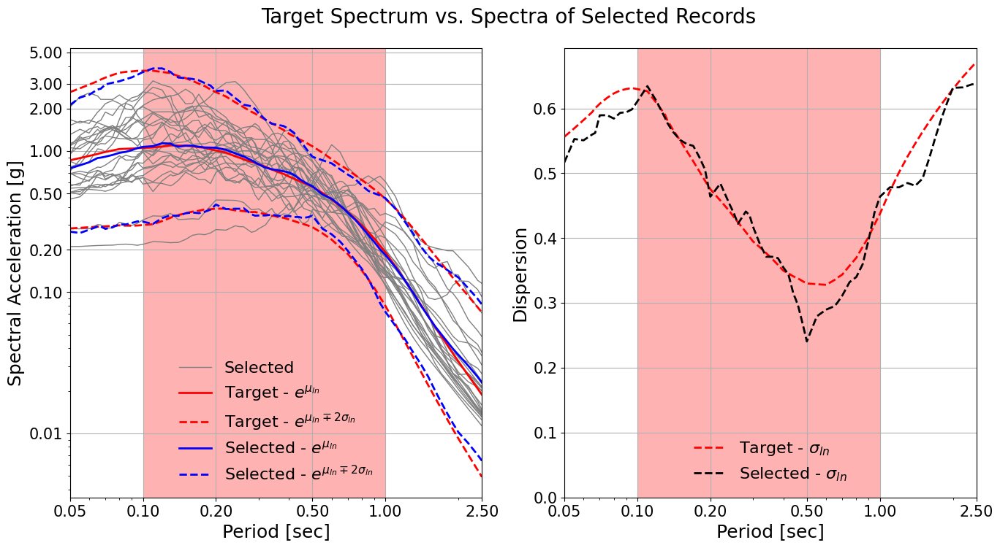

Finished writing process, the files are located in
c:\Users\osama\OneDrive\Desktop\EzGM-master 2\EzGM-master\Examples\binder\EzGM_Outputs_AvgSA\POE-0.0025-in-50-years
Changing number of components to 2 for this horizontal spectra component definition: RotD50...


C:\Users\osama\AppData\Local\Temp\ipykernel_15064\1688969730.py:2096: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  mu_lnSaT[i] = params[0]
C:\Users\osama\AppData\Local\Temp\ipykernel_15064\1688969730.py:2097: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  sigma_lnSaT[i] = params[1][0]
C:\Users\osama\AppData\Local\Temp\ipykernel_15064\1688969730.py:2096: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  mu_lnSaT[i] = params[0]
C:\Users\osama\AppData\Local\Temp\ipykernel

Target spectrum is created.
Ground motion selection is finished.
For T ∈ [0.05 - 2.50]
Max error in median = 29.18 %
Max error in standard deviation = 17.89 %


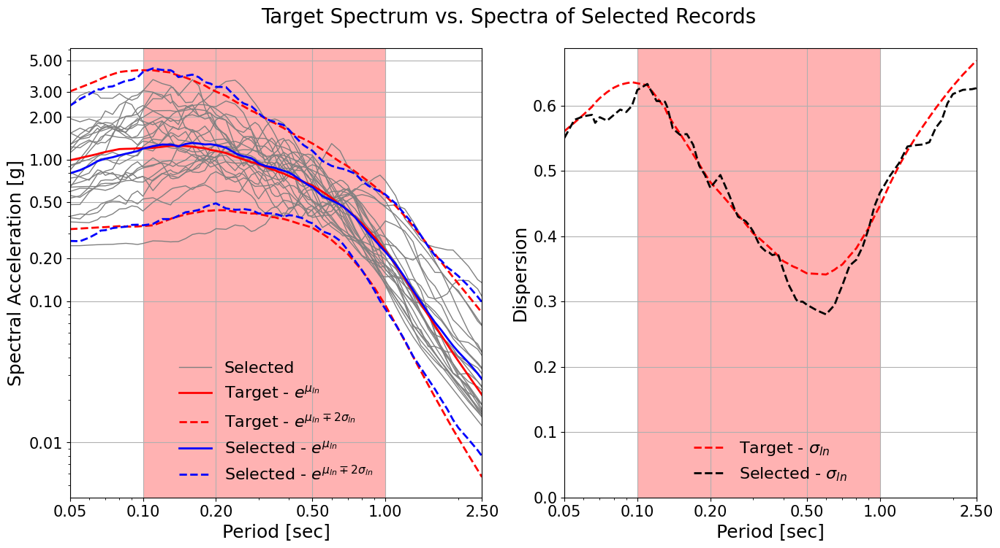

Finished writing process, the files are located in
c:\Users\osama\OneDrive\Desktop\EzGM-master 2\EzGM-master\Examples\binder\EzGM_Outputs_AvgSA\POE-0.001-in-50-years


In [ ]:
# Check attributes of ground motion prediction equation BooreEtAl2014
check_gmpe_attributes(gmpe='BooreEtAl2014')

# Get list of IMs
ims = []
for file in os.listdir(post_dir):
    if file.startswith('imls'):
        ims.append(file.split('_')[1].split('.out')[0])

# Start selecting records for each IM in the IM list
for im in ims:
    # Read hazard and disaggregation info
    imls = np.loadtxt(os.path.join(post_dir, 'imls_' + im + '.out'))
    mean_mags = np.loadtxt(os.path.join(post_dir, 'mean_mags_' + im + '.out'))
    mean_dists = np.loadtxt(os.path.join(post_dir, 'mean_dists_' + im + '.out'))

    for i in range(len(poes)):
        # a) We can use mean magnitude and mean distance values to compute approximate CS.
        mags = [mean_mags[i]]
        dists = [mean_dists[i]]
        hconts = [1.0]
        rakes = [0.0]
        
        # b) We can also consider all contributing scenarios to compute exact CS.
        disagg = np.loadtxt(os.path.join(post_dir,'MagDist_poe_' + str(poes[i]) + '_' + im + '.out'))
        mags = disagg[:, 0].tolist()
        dists = disagg[:, 1].tolist()
        hconts = disagg[:, 2].tolist()
        rakes = [0.0]*len(mags)
        
        # 1) Initialize the conditional_spectrum object for record selection, check which parameters are required for the gmpe you are using.
        cs = ConditionalSpectrum(database='NGA_W2', output_directory=os.path.join('EzGM_Outputs_' + im, 'POE-' + str(poes[i]) + '-in-50-years'))

        # 2) Create target spectrum
        cs.create(Tstar=np.arange(0.1, 1.1, 0.1), gmpe='BooreEtAl2014', num_components=1, spectrum_definition='RotD50', 
                  site_param={'vs30': reference_vs30_value}, rup_param={'rake': rakes, 'mag': mags},
                  dist_param={'rjb': dists}, hz_cont=hconts, period_range=[0.05, 2.5],
                  im_Tstar=imls[i], epsilon=None, use_variance=1, correlation_model='baker_jayaram')

        # 3) Select the ground motions
        cs.select(num_records=25, is_scaled=1, max_scale_factor=2.5,
                  mag_limits=None, vs30_limits=None, rjb_limits=None, mech_limits=None, num_simulations=20,
                  error_weights=[1, 2, 0.3], seed_value=0, num_greedy_loops=2, penalty=3, tolerance=10)

        # Plot the target spectrum, simulated spectra and spectra of selected records
        cs.plot(target=0, simulations=0, records=1, save=1, show=1)

        cs.write(object=1, records=0, zip_parent_path='')